#### 1. Importing the required libraries 

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import scipy.signal as signal
from sklearn.cluster import KMeans
import random
from scipy.optimize import minimize
from scipy.optimize import differential_evolution
from collections import Counter
import math
from scipy import interpolate

#### 2. Creating a single excel file from all

In [2]:
# Set the path to the folder containing the Excel files
folder_path = "C:\\Users\\vibhe\\OneDrive\\Desktop\\DriveCycle\\Raw Data\\Bhivesh\\Trips"

# Set the name of the output Excel file
output_file = "AllInOne_withAngle.xlsx"

# Set the name of the columns to select from each Excel file
column_name = ["Speed", "Elevation"]

# Create an empty list to store the selected data
data = []

# Loop through all Excel files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".xlsx") and not file_name.startswith("~$"):
        # Read in the Excel file
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_excel(file_path)
        
        if column_name[0] in df.columns and column_name[1] in df.columns:
            # Select the desired columns and append them to the data list
            column_data = df[column_name]
#             print(column_data)
            data.append(column_data)
        
# Concatenate the data into a single dataframe
output_df = pd.concat(data).reset_index(drop=True)



Adding all other required feilds 

In [3]:
output_df["hyp"] = (output_df['Speed'] + output_df['Speed'].shift(1)) / 2
output_df.loc[0,"hyp"] = 0
output_df["per"] = output_df['Elevation'].diff()
output_df['angle'] = np.arcsin(output_df['per'] / output_df['hyp']) * 180 / np.pi
output_df['angle'] = output_df['angle'].fillna(0)

output_df

C:\Users\vibhe\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in arcsin
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Speed,Elevation,hyp,per,angle
0,0.047,284.4,0.0000,NaN,0.000000
1,0.109,284.7,0.0780,0.3,0.000000
2,0.150,286.6,0.1295,1.9,0.000000
3,0.207,287.4,0.1785,0.8,0.000000
4,1.653,289.3,0.9300,1.9,0.000000
...,...,...,...,...,...
39691,2.955,303.5,3.0900,-0.2,-3.711059
39692,2.469,303.3,2.7120,-0.2,-4.229192
39693,1.851,303.5,2.1600,0.2,5.312775
39694,0.000,303.2,0.9255,-0.3,-18.914032


### 3. Setting up the new dataframe and Filtering the data

In [4]:
# Define the Butterworth filter parameters
order = 2
cutoff_frequency = 0.1 # in Hz

# Define the filter function
def butterworth_filter(data, order, cutoff_frequency, sampling_frequency):
    nyquist_frequency = 0.5 * sampling_frequency
    normalized_cutoff_frequency = cutoff_frequency / nyquist_frequency
    b, a = signal.butter(order, normalized_cutoff_frequency, btype='lowpass')
    filtered_data = signal.filtfilt(b, a, data)
    return filtered_data

# Apply the Butterworth filter to the Speed column
df_all = output_df
df_all = df_all[df_all['Speed'] > 0]
sampling_frequency = 1.0  # assumes unit time interval between samples
df_all['Filtered_speed'] = butterworth_filter(df_all['Speed'], order, cutoff_frequency, sampling_frequency)
order = 4
cutoff_frequency = 0.05 # in Hz
df_all['Filtered_angle'] = butterworth_filter(df_all['angle'], order, cutoff_frequency, sampling_frequency)
df_all['Filtered_speed'] = df_all['Filtered_speed'].round(2)

C:\Users\vibhe\AppData\Local\Temp/ipykernel_11596/4059986352.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all['Filtered_speed'] = butterworth_filter(df_all['Speed'], order, cutoff_frequency, sampling_frequency)
C:\Users\vibhe\AppData\Local\Temp/ipykernel_11596/4059986352.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all['Filtered_angle'] = butterworth_filter(df_all['angle'], order, cutoff_frequency, sampling_frequency)
C:\Users\vibhe\AppData\Local\Temp/ipykernel_11596/4059986352.py:21: 

In [5]:
df_all.head()

,Speed,Elevation,hyp,per,angle,Filtered_speed,Filtered_angle
0,0.047,284.4,0.0000,NaN,0.0,0.05,0.021033
1,0.109,284.7,0.0780,0.3,0.0,0.24,2.180397
2,0.150,286.6,0.1295,1.9,0.0,0.56,4.234122
3,0.207,287.4,0.1785,0.8,0.0,1.09,6.091817
4,1.653,289.3,0.9300,1.9,0.0,1.84,7.676363


Ploting the first 200 values to see wether the plot filter is working 

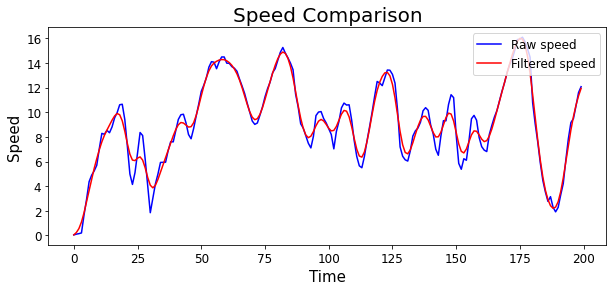

In [6]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Plot the two series
ax.plot(df_all['Speed'][:200], label="Raw speed", color='blue')
ax.plot(df_all['Filtered_speed'][:200], label="Filtered speed", color='red')

# Add a title and axis labels
ax.set_title("Speed Comparison", fontsize=20)
ax.set_xlabel("Time", fontsize=15)
ax.set_ylabel("Speed", fontsize=15)

# Add a legend
ax.legend(fontsize=12, loc='upper right')

# Adjust the font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=12)

# Show the plot
plt.show()

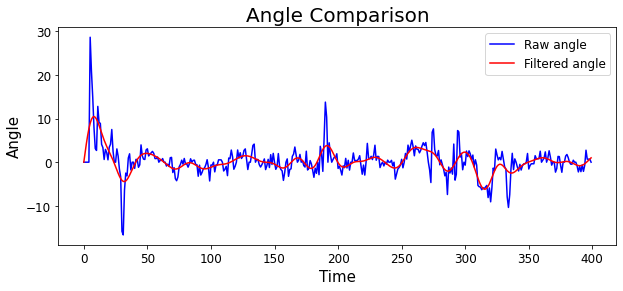

In [7]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Plot the two series
ax.plot(df_all['angle'][:400], label="Raw angle", color='blue')
ax.plot(df_all['Filtered_angle'][:400], label="Filtered angle", color='red')

# Add a title and axis labels
ax.set_title("Angle Comparison", fontsize=20)
ax.set_xlabel("Time", fontsize=15)
ax.set_ylabel("Angle", fontsize=15)

# Add a legend
ax.legend(fontsize=12, loc='upper right')

# Adjust the font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=12)

# Show the plot
plt.show()

In [8]:
df_all['acceleration'] = df_all['Filtered_speed'].diff()
df_all = df_all.dropna() # droping all the nan values 
df_all = df_all.reset_index(drop = True) #The index should be reindexed after deleting the nan values

C:\Users\vibhe\AppData\Local\Temp/ipykernel_11596/1884887237.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all['acceleration'] = df_all['Filtered_speed'].diff()


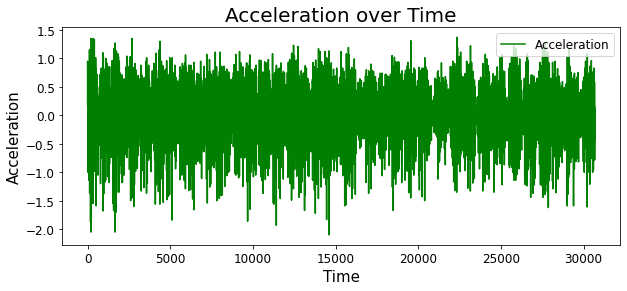

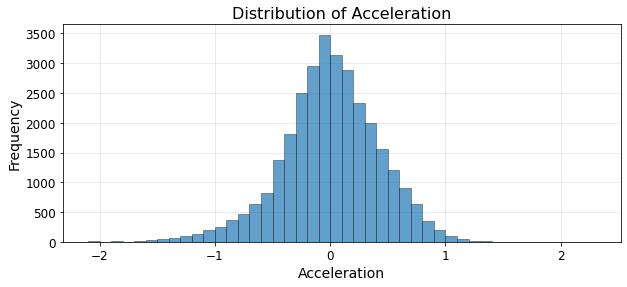

In [9]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Plot the acceleration series
ax.plot(df_all['acceleration'], label="Acceleration", color='green')

# Add a title and axis labels
ax.set_title("Acceleration over Time", fontsize=20)
ax.set_xlabel("Time", fontsize=15)
ax.set_ylabel("Acceleration", fontsize=15)

# Add a legend
ax.legend(fontsize=12, loc='upper right')

# Adjust the font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=12)

# Show the plot
plt.show()


fig, ax = plt.subplots(figsize=(10,4))

ax.hist(df_all['acceleration'], bins=np.arange(df_all['acceleration'].min(), df_all['acceleration'].max()+1, 0.1), alpha=0.7, edgecolor='black', linewidth=0.5)

ax.set_xlabel('Acceleration', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.set_title('Distribution of Acceleration', fontsize=16)
ax.grid(True, alpha=0.3)
ax.set_axisbelow(True)
ax.tick_params(axis='both', labelsize=12)

plt.show()

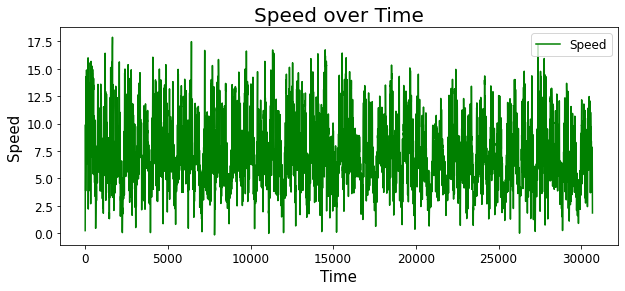

In [10]:
# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Plot the speed series
ax.plot(df_all['Filtered_speed'], label="Speed", color='green')

# Add a title and axis labels
ax.set_title("Speed over Time", fontsize=20)
ax.set_xlabel("Time", fontsize=15)
ax.set_ylabel("Speed", fontsize=15)

# Add a legend
ax.legend(fontsize=12, loc='upper right')

# Adjust the font size of tick labels
ax.tick_params(axis='both', which='major', labelsize=12)

# Show the plot
plt.show()


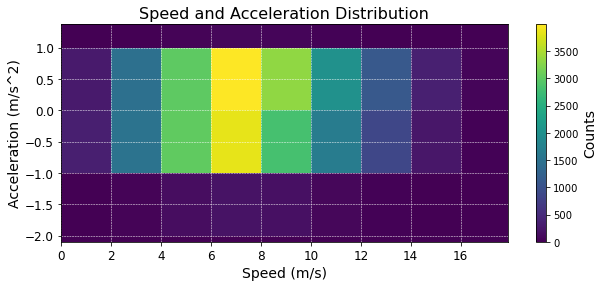

In [11]:
# Define the data and bin sizes
speed_data = df_all['Filtered_speed']
acceleration_data = df_all['acceleration']
speed_bins = np.linspace(0, 80, 41)
acceleration_bins = np.linspace(-30, 30, 61)

# Create the 2D histogram
plt.figure(figsize=(10, 4))
hist = plt.hist2d(speed_data, acceleration_data, bins=[speed_bins, acceleration_bins], cmap=plt.cm.viridis)

# Add axis labels and a title
plt.xlabel('Speed (m/s)', fontsize=14)
plt.ylabel('Acceleration (m/s^2)', fontsize=14)
plt.title('Speed and Acceleration Distribution', fontsize=16)

# Add a grid
plt.grid(linestyle='--', linewidth=0.5, color='white')

# Set the colorbar label
cbar = plt.colorbar(hist[3])
cbar.ax.set_ylabel('Counts', fontsize=14)

# Set the tick label sizes
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Limit the x and y axis values to the maximum values of the data
plt.xlim(0, np.max(speed_data))
plt.ylim(np.min(acceleration_data), np.max(acceleration_data))

# Show the plot
plt.show()

In [12]:
df_all = df_all[df_all['Speed'] > 0]
df_all

,Speed,Elevation,hyp,per,angle,Filtered_speed,Filtered_angle,acceleration
0,0.109,284.7,0.0780,0.3,0.000000,0.24,2.180397,0.19
1,0.150,286.6,0.1295,1.9,0.000000,0.56,4.234122,0.32
2,0.207,287.4,0.1785,0.8,0.000000,1.09,6.091817,0.53
3,1.653,289.3,0.9300,1.9,0.000000,1.84,7.676363,0.75
4,2.932,290.4,2.2925,1.1,28.674007,2.75,8.929467,0.91
...,...,...,...,...,...,...,...,...
30679,3.002,303.9,2.7210,-0.3,-6.329934,2.59,-3.319706,0.14
30680,3.225,303.7,3.1135,-0.2,-3.683010,2.65,-1.676789,0.06
30681,2.955,303.5,3.0900,-0.2,-3.711059,2.53,0.278803,-0.12
30682,2.469,303.3,2.7120,-0.2,-4.229192,2.25,2.456882,-0.28


### 4. K means clustering for different speed bins 

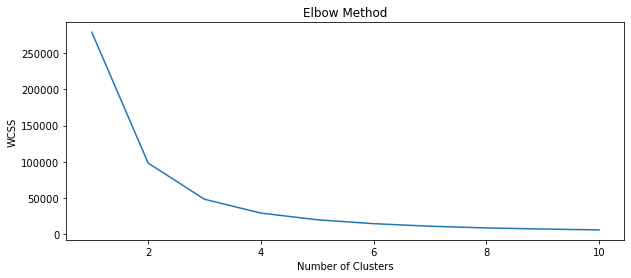

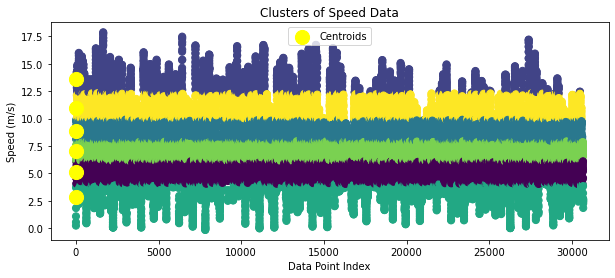

In [13]:
# Reshape the speed data to a 2D array
X = np.array(df_all['Filtered_speed']).reshape(-1, 1)

# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10, 4))
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()
x_indices = range(len(X))
# Train the K-means model
kmeans = KMeans(n_clusters=6, init='k-means++', random_state=42)
y_kmeans = kmeans.fit_predict(X)

# Get the speed ranges for each cluster
speed_ranges = []
for i in range(6):
    cluster_indices = np.where(y_kmeans == i)[0]
    min_speed = X[cluster_indices].min()
    max_speed = X[cluster_indices].max()
    speed_ranges.append((min_speed, max_speed))

# Create a bigger plot with all the clusters
fig, ax = plt.subplots(figsize=(10,4))
ax.scatter(x_indices, X, c=y_kmeans, s=50)
ax.scatter(range(len(kmeans.cluster_centers_)), kmeans.cluster_centers_[:, 0], s=200, c='yellow', label='Centroids')
ax.set_title('Clusters of Speed Data')
ax.set_xlabel('Data Point Index')
ax.set_ylabel('Speed (m/s)')
ax.legend()
plt.show()




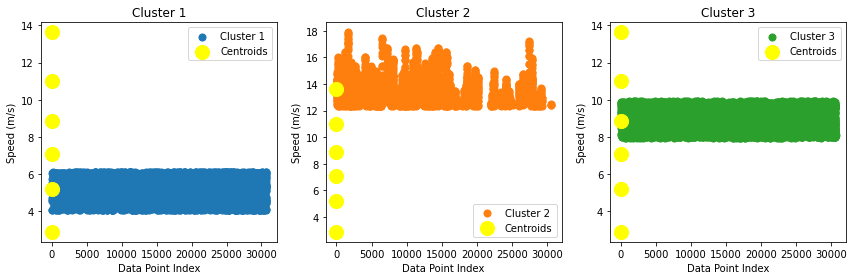

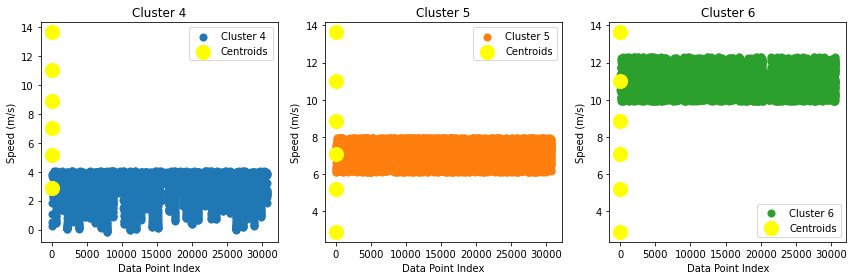

In [14]:
# Create three rows of individual cluster plots
for i in range(0, len(np.unique(y_kmeans)), 3):
    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    for j, ax in enumerate(axes.flat):
        cluster_num = i + j
        if cluster_num >= len(np.unique(y_kmeans)):
            ax.axis('off')
            continue
        ax.scatter([x_indices[k] for k in np.where(y_kmeans == cluster_num)[0]], 
                   X[y_kmeans == cluster_num], 
                   s=50, 
                   c='C'+str(j),
                   label='Cluster '+str(cluster_num+1))
        ax.scatter(range(len(kmeans.cluster_centers_)), 
                   kmeans.cluster_centers_[:, 0], 
                   s=200, 
                   c='yellow', 
                   label='Centroids')
        ax.set_title('Cluster '+str(cluster_num+1))
        ax.set_xlabel('Data Point Index')
        ax.set_ylabel('Speed (m/s)')
        ax.legend()
    plt.tight_layout()
    plt.show()

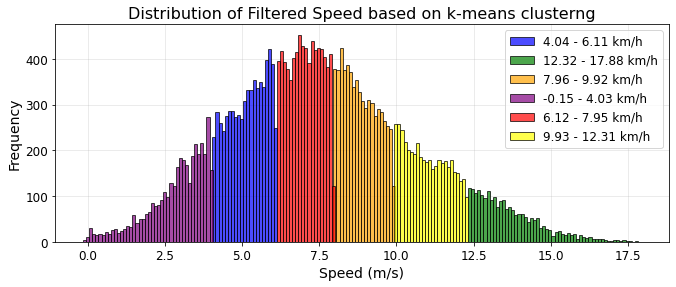

In [15]:

colors = ['blue', 'green', 'orange', 'purple', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(11,4))

for i, (start, end) in enumerate(speed_ranges):
    mask = (df_all['Filtered_speed'] >= start) & (df_all['Filtered_speed'] < end)
    ax.hist(df_all['Filtered_speed'][mask], bins=np.arange(start, end+0.1, 0.1), alpha=0.7, facecolor=colors[i], edgecolor='black', label=f'{start:.2f} - {end:.2f} km/h')

ax.set_xlabel('Speed (m/s)', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)
ax.set_title('Distribution of Filtered Speed based on k-means clusterng', fontsize=16)
ax.legend(fontsize=12)
ax.grid(True, alpha=0.3)
ax.set_axisbelow(True)
ax.tick_params(axis='both', labelsize=12)

plt.show()

In [16]:
consecutive_zeros = df_all.eq(0).cumsum()
mask = consecutive_zeros.sub(consecutive_zeros.mask(df_all.ne(0)).ffill().fillna(0)).ge(1000)

# Delete rows with more than 1000 consecutive zeros
df = df_all.loc[~mask.any(axis=1)]

In [17]:
df_all

,Speed,Elevation,hyp,per,angle,Filtered_speed,Filtered_angle,acceleration
0,0.109,284.7,0.0780,0.3,0.000000,0.24,2.180397,0.19
1,0.150,286.6,0.1295,1.9,0.000000,0.56,4.234122,0.32
2,0.207,287.4,0.1785,0.8,0.000000,1.09,6.091817,0.53
3,1.653,289.3,0.9300,1.9,0.000000,1.84,7.676363,0.75
4,2.932,290.4,2.2925,1.1,28.674007,2.75,8.929467,0.91
...,...,...,...,...,...,...,...,...
30679,3.002,303.9,2.7210,-0.3,-6.329934,2.59,-3.319706,0.14
30680,3.225,303.7,3.1135,-0.2,-3.683010,2.65,-1.676789,0.06
30681,2.955,303.5,3.0900,-0.2,-3.711059,2.53,0.278803,-0.12
30682,2.469,303.3,2.7120,-0.2,-4.229192,2.25,2.456882,-0.28


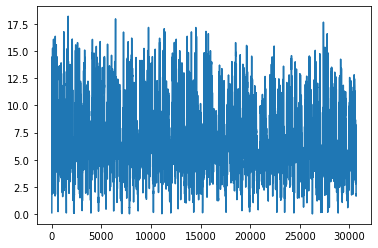

In [18]:
plt.plot(df_all['Speed'])

### 5. Setting the modes for each point 

In [19]:
# Set up the parameters
res = [0.9, 0.3, 2, 0.6]

a1 = res[0]
a2 = res[1]
n = res[2]
delta = res[3]

df_all['mode'] = "None" 

# Create a new column called 'check_acc' that is True if the acceleration is greater than or equal to a2

df_all['check_acc'] = (df_all['acceleration'] >= a2)

# Initialize empty dictionaries to store information about acceleration and deacceleration snippets
dic_acc = {}
dic_dacc = {}

# Extract the check_acc and speed columns as lists
check_acc = df_all['check_acc'].tolist()[1:]
speed = df_all['Filtered_speed'].tolist()[1:]

# Initialize a counter variable
d = 0

# Iterate through each row of the check_acc and speed lists
for i in range(len(check_acc)):
    
    # If the current row indicates that acceleration is >= a2, increment the counter
    if check_acc[i]:
        d += 1
        
    # If the current row indicates that acceleration is < a2, and the previous n rows had acceleration >= a2, 
    # and the speed has increased by more than delta over those n rows, add the acceleration snippet to dic_acc 
    elif d > n and speed[i] - speed[i-d] > delta:
        dic_acc[i-d+1] = d
        d = 0
        
    # If the above conditions are not met, reset the counter
    else:
        d = 0

# Initialize the 'mode' column to None for all rows


# For each acceleration snippet in dic_acc, set the 'mode' column to 'Acceleration'
ji = 0
for key, value in dic_acc.items():
    df_all.iloc[key:key+value, 3] = 'Acceleration'
    ji+=1

# For rows where acceleration is greater than a1, set the 'mode' column to 'Acceleration'
df_all.loc[df_all['acceleration'] > a1, 'mode'] = 'Acceleration'

# Repeat the above process for deacceleration
df_all['check_dacc'] = (df_all['acceleration'] <= -a2) 
check_dacc = df_all['check_dacc'].tolist()[1:]
d = 0
for i in range(len(check_dacc)):
    if check_dacc[i]:
        d += 1
    elif d > n and speed[i-d] - speed[i] > delta:
        dic_dacc[i-d+1] = d
        d = 0
    else:
        d = 0

for key, value in dic_dacc.items():
    df_all.iloc[key:key+value, 3] = 'Deacceleration'
df_all.loc[df_all['acceleration'] < -a1, 'mode'] = 'Deacceleration'


# Set mode to 'cruise' for rows where acceleration is positive and mode is None
df_all.loc[(df_all['acceleration'] > 0) & (df_all['mode']=='None'), 'mode'] = 'cruise'


# Set mode to 'idle' for rows where acceleration is negative and mode is None
df_all.loc[(df_all['acceleration'] <= 0) & (df_all['mode']=='None'), 'mode'] = 'idle'

# Removing the columns that are not needed
df_all.drop(['check_acc', 'check_dacc'], axis=1, inplace=True)

In [20]:
meanSpeed = df_all['Filtered_speed'].mean()
stdspeed = df_all['Filtered_speed'].std()
meanAcceleration = df_all['acceleration'].mean()
stdAcceleration = df_all['acceleration'].std()
countMode = df_all['mode'].value_counts()
accTime = (countMode["Acceleration"]/len(df_all))*100
daccTime = (countMode["Deacceleration"]/len(df_all))*100
idleTime = (countMode["idle"]/len(df_all))*100
cruiseTime = (countMode["cruise"]/len(df_all))*100

data_dict = {
    "meanSpeed": meanSpeed,
    "stdspeed": stdspeed,
    "meanAcceleration": meanAcceleration,
    "stdAcceleration": stdAcceleration,
    "countMode": countMode,
    "accTime": accTime,
    "daccTime": daccTime,
    "idleTime": idleTime,
    "cruiseTime": cruiseTime
}
print(data_dict)

{'meanSpeed': 7.549717116412521, 'stdspeed': 3.0170480470348, 'meanAcceleration': 5.866249511145884e-05, 'stdAcceleration': 0.42679775557835076, 'countMode': cruise            14994
idle              14392
Deacceleration      898
Acceleration        400
Name: mode, dtype: int64, 'accTime': 1.303611002476861, 'daccTime': 2.9266067005605527, 'idleTime': 46.903923869117456, 'cruiseTime': 48.86585842784513}


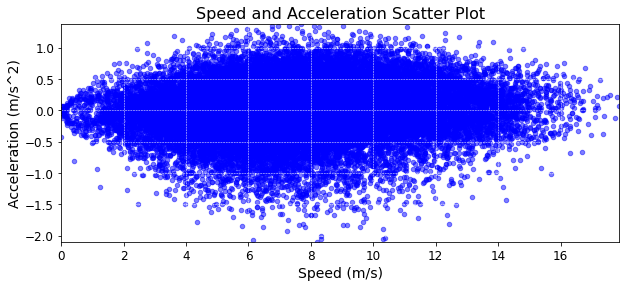

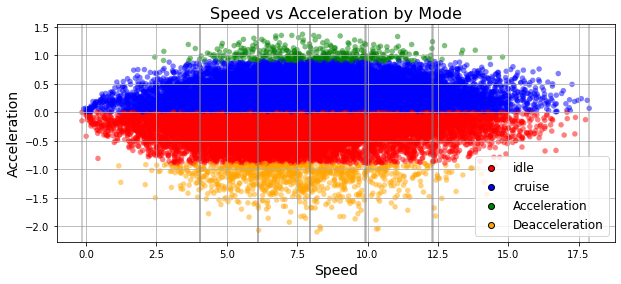

In [21]:
# Define the data
speed_data = df_all['Filtered_speed']
acceleration_data = df_all['acceleration']

# Create the scatter plot
plt.figure(figsize=(10, 4))
plt.scatter(speed_data, acceleration_data, s=20, c='blue', alpha=0.5)

# Add axis labels and a title
plt.xlabel('Speed (m/s)', fontsize=14)
plt.ylabel('Acceleration (m/s^2)', fontsize=14)
plt.title('Speed and Acceleration Scatter Plot', fontsize=16)

# Add a grid
plt.grid(linestyle='--', linewidth=0.5, color='white')

# Set the tick label sizes
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Limit the x and y axis values to the maximum values of the data
plt.xlim(0, max(speed_data))
plt.ylim(min(acceleration_data), max(acceleration_data))

# Show the plot
plt.show()

from matplotlib.colors import ListedColormap

# Define colors for each mode category
colors = {'idle': 'red', 'cruise': 'blue', 'Acceleration': 'green', 'Deacceleration': 'orange'}

# Create a colormap to map mode category to colors
cmap = ListedColormap([colors[mode] for mode in df_all['mode'].unique()])

# Create data for scatter plot
speed_data = df_all['Filtered_speed']
acceleration_data = df_all['acceleration']
mode_data = df_all['mode']

fig, ax = plt.subplots(figsize=(10, 4))
plt.scatter(speed_data, acceleration_data, s=30, c=mode_data.map(colors), cmap=cmap, alpha=0.5, edgecolors='none')

# Add vertical lines for each speed range
for speed_range in speed_ranges:
    ax.axvline(x=speed_range[0], color='gray', alpha=0.5)
    ax.axvline(x=speed_range[1], color='gray', alpha=0.5)


# Add axis labels and a title
plt.xlabel('Speed', fontsize=14)
plt.ylabel('Acceleration', fontsize=14)
plt.title('Speed vs Acceleration by Mode', fontsize=16)

# Add grid
plt.grid(True)

# Add legend
handles = []
labels = []
for mode, color in colors.items():
    handles.append(plt.scatter([], [], c=color, label=mode, edgecolors='black'))
    labels.append(mode)

plt.legend(handles, labels, loc='lower right', fontsize=12)

plt.show()


####  6. Snippit creation 

In [22]:
# This res will have the snippit information with starting index ending index and the mode in which 
# it is working 

mode = df_all['mode'].tolist()

currMode = None 
l = 0 
r = 0
snippit = []
while r < len(mode):
    currMode = mode[l]
    r += 1  
    while r < len(mode) and mode[r] == currMode :
        r += 1 
        
    snippit.append([(l,r-1),currMode])
    l = r 
    
print(snippit[:20],'..............')

[[(0, 3), 'cruise'], [(4, 6), 'Acceleration'], [(7, 16), 'cruise'], [(17, 19), 'idle'], [(20, 20), 'Deacceleration'], [(21, 23), 'idle'], [(24, 25), 'cruise'], [(26, 30), 'idle'], [(31, 41), 'cruise'], [(42, 44), 'idle'], [(45, 57), 'cruise'], [(58, 70), 'idle'], [(71, 81), 'cruise'], [(82, 84), 'idle'], [(85, 88), 'Deacceleration'], [(89, 91), 'idle'], [(92, 96), 'cruise'], [(97, 100), 'idle'], [(101, 105), 'cruise'], [(106, 108), 'idle']] ..............


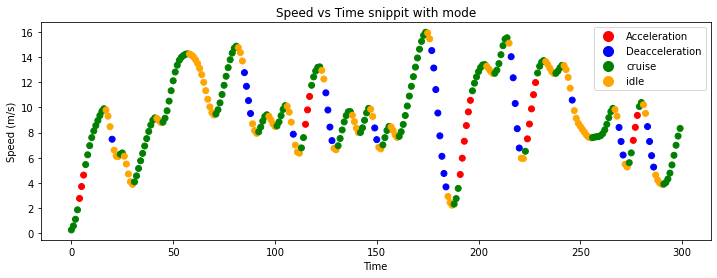

In [23]:

# Set colors for each mode category
colors = {'Acceleration': 'red', 'Deacceleration': 'blue', 'cruise': 'green', 'idle': 'orange'}

# Create a list of colors for each data point based on the mode category
color_list = [colors[mode] for mode in df_all['mode']]

plt.figure(figsize=(12, 4))
# Plot the first 100 data points of the Speed data with different colors for each mode category
plt.scatter(df_all.index[:300], df_all['Filtered_speed'][:300], c=color_list[:300])

# Set the x-axis label and title
plt.xlabel('Time')
plt.title('Speed vs Time snippit with mode')

# Set the y-axis label
plt.ylabel('Speed (m/s)')

# Show the legend with the labels for each color
handles = [plt.plot([], [], color=colors[key], marker='o', ls="", markersize=10)[0] for key in colors]
plt.legend(handles, colors.keys())

plt.show()

#### 6. Transition Probability Matrix
This transition_mode_speed will contain the tansition of modes with respect to speed ranges required in transion probability matrix

In [24]:
transition_mode_speed = {}
for interval in speed_ranges :
    starting_speed = interval[0]
    ending_speed = interval[1]
    transition_mode_speed[(starting_speed,ending_speed)] = []
    for i in range(len(snippit)-1):
        
        snip = snippit[i]
        ev = df_all['Filtered_speed'][snip[0][1]]
        
        if ev>=starting_speed and ev<ending_speed:
            transition_mode_speed[(starting_speed,ending_speed)].append((snip[1],snippit[i+1][1]))
transition_mode_speed

{(4.04, 6.11): [('Acceleration', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('Deacceleration', 'idle'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('cruise', 'Acceleration'),
  ('Deacceleration', 'idle'),
  ('idle', 'cruise'),
  ('cruise', 'Acceleration'),
  ('Deacceleration', 'idle'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('Deacceleration', 'idle'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('idle', 'cruise'),
  ('cruise', 'idle'),
  ('idle', 'cruise'),
  ('cr

In [25]:
transition_probability_matrix = {}
dic_modes = {'Acceleration':0, 'Deacceleration':1, 'cruise':2, 'idle':3}
modes = ['Acceleration', 'Deacceleration', 'cruise', 'idle']

for t in transition_mode_speed:
    
    # Initialize the transition probability matrix
    n_modes = len(modes)
    P = np.zeros((n_modes, n_modes))
    only_modes = transition_mode_speed[t]

    # Count the number of transitions between modes
    for i in range(len(only_modes)):
        row = dic_modes[only_modes[i][0]]
        col = dic_modes[only_modes[i][1]]
        P[row, col] += 1

    # Normalize the counts to get probabilities
    for i in range(n_modes):
        row_sum = np.sum(P[i, :])
        if row_sum > 0:
            P[i, :] /= row_sum
    transition_probability_matrix[t] = P

In [26]:
transition_probability_matrix


{(4.04,
  6.11): array([[0.        , 0.        , 1.        , 0.        ],
        [0.        , 0.        , 0.        , 1.        ],
        [0.16      , 0.        , 0.        , 0.84      ],
        [0.        , 0.01828154, 0.98171846, 0.        ]]),
 (12.32,
  17.88): array([[0.        , 0.        , 1.        , 0.        ],
        [0.        , 0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        , 1.        ],
        [0.        , 0.52325581, 0.47674419, 0.        ]]),
 (7.96,
  9.92): array([[0.        , 0.        , 1.        , 0.        ],
        [0.        , 0.        , 0.        , 1.        ],
        [0.06597938, 0.        , 0.        , 0.93402062],
        [0.        , 0.30769231, 0.69230769, 0.        ]]),
 (-0.15,
  4.03): array([[0. , 0. , 0. , 0. ],
        [0. , 0. , 0. , 1. ],
        [0.2, 0. , 0. , 0.8],
        [0. , 0. , 1. , 0. ]]),
 (6.12,
  7.95): array([[0.        , 0.        , 1.        , 0.        ],
        [0.        , 0.        , 0.

In [27]:
next_mode_dict = {}
for speed_interval in transition_probability_matrix:

    next_mode_dict[speed_interval] = {}
    
    for i,s in enumerate(modes):
        
        next_mode_dict[speed_interval][s] = modes[transition_probability_matrix[speed_interval][i].argmax()]


In [28]:
next_mode_dict # It will have the information about the transiton of mode based on current speed and curent mode

{(4.04, 6.11): {'Acceleration': 'cruise',
  'Deacceleration': 'idle',
  'cruise': 'idle',
  'idle': 'cruise'},
 (12.32, 17.88): {'Acceleration': 'cruise',
  'Deacceleration': 'Acceleration',
  'cruise': 'idle',
  'idle': 'Deacceleration'},
 (7.96, 9.92): {'Acceleration': 'cruise',
  'Deacceleration': 'idle',
  'cruise': 'idle',
  'idle': 'cruise'},
 (-0.15, 4.03): {'Acceleration': 'Acceleration',
  'Deacceleration': 'idle',
  'cruise': 'idle',
  'idle': 'cruise'},
 (6.12, 7.95): {'Acceleration': 'cruise',
  'Deacceleration': 'idle',
  'cruise': 'idle',
  'idle': 'cruise'},
 (9.93, 12.31): {'Acceleration': 'cruise',
  'Deacceleration': 'idle',
  'cruise': 'idle',
  'idle': 'cruise'}}

In [29]:
final = {}
modes = ['Acceleration', 'Deacceleration', 'cruise', 'idle']
for i in set(modes):
    final[i] = {}
filtered_speed = df_all['Filtered_speed']

for snip in snippit:
    mode_of_snnipit = snip[1]
    start_index = snip[0][0]
    end_index = snip[0][1]
    starting_speed = filtered_speed[start_index]
    ending_speed = filtered_speed[end_index]
    
    if starting_speed not in final[mode_of_snnipit]:
        final[mode_of_snnipit][starting_speed] = []
        
    final[mode_of_snnipit][starting_speed].append([(start_index,end_index),ending_speed])

In [30]:
final

{'Acceleration': {2.75: [[(4, 6), 4.61]],
  8.66: [[(115, 117), 10.88]],
  4.66: [[(191, 196), 10.57], [(14607, 14610), 7.92]],
  7.5: [[(224, 228), 11.99]],
  7.38: [[(276, 278), 9.37]],
  4.31: [[(335, 342), 12.65]],
  10.03: [[(379, 380), 11.01]],
  8.49: [[(407, 411), 13.34]],
  7.6: [[(487, 490), 10.57], [(4469, 4470), 8.53]],
  6.39: [[(918, 921), 9.47]],
  6.53: [[(953, 954), 7.56]],
  4.55: [[(1101, 1104), 7.43]],
  8.17: [[(1187, 1187), 8.17]],
  7.46: [[(1486, 1486), 7.46]],
  9.51: [[(1556, 1558), 11.39]],
  6.24: [[(1584, 1587), 9.52]],
  11.15: [[(1600, 1601), 12.12]],
  5.48: [[(1627, 1633), 11.67], [(10762, 10762), 5.48]],
  5.65: [[(1667, 1672), 11.34]],
  4.39: [[(1740, 1743), 7.57]],
  6.98: [[(1834, 1838), 11.1]],
  5.86: [[(1867, 1869), 7.82], [(18421, 18425), 9.9]],
  7.87: [[(1919, 1921), 9.75]],
  5.61: [[(2372, 2374), 7.65]],
  9.16: [[(2548, 2549), 10.13]],
  8.13: [[(2581, 2584), 11.1]],
  7.54: [[(2634, 2634), 7.54]],
  5.4: [[(2693, 2697), 10.32], [(20396, 2

### 8. Drive Cycle Generation 
1. First we have to find all the snnipits that starts with zero speed 
and then choose randomly from it 
2. For the sake of simplicity we will choose the idle one in the starting 
3. Depending upon the speed and current mode the next mode of opreation is selected 
4. Now after this we will find the next snnipits which have the mode as that of the next mode slected and its starting speed lies within the desired range after the ending of last snnipit 

In [37]:
def driveCycle(tol):
    drivecycle = [] # This will store the drive cycle information 
    elevation = []
    mode = []


    current_mode = 'idle' # Selecting the first mode for the first snippit 
    contender_snippit = final[current_mode][0.1] # Chooosing the starting snnipit from the idle mode that had the starting speed zero 
    randomly_choosen_snnipit = random.choice(contender_snippit) # Randomly choose the starting snnipit 

    # Adding the speed valuesof the snnipit to the drivecycle choosen 
    for i in range(randomly_choosen_snnipit[0][0],randomly_choosen_snnipit[0][1]+1):
        drivecycle.append(df_all['Filtered_speed'][i])
        elevation.append(df_all['angle'][i])
        mode.append(current_mode)
    ending_speed_of_snnipit = randomly_choosen_snnipit[1]
    # Now we have to check the ending speed of the snnipit lies within what class of the speed
    for tup in speed_ranges:
        if ending_speed_of_snnipit >= tup[0] and ending_speed_of_snnipit < tup[1]:
            speed_class = tup 
    # Now according to the speed class we will select the next mode of opreation 
    next_mode = next_mode_dict[speed_class][current_mode]

    for x in range(400):
        tolerance = tol
        min_allowed_speed = ending_speed_of_snnipit-tolerance
        max_allowed_speed = ending_speed_of_snnipit+tolerance
        contender_snippit = []
        for s in final[next_mode]:
            if s>min_allowed_speed and s<max_allowed_speed:
                contender_snippit.extend(final[next_mode][round(s, 2)])

        randomly_choosen_snnipit = random.choice(contender_snippit) # Randomly choose the starting snnipit 
        
        
        # Adding the speed valuesof the snnipit to the drivecycle choosen 
        for i in range(randomly_choosen_snnipit[0][0],randomly_choosen_snnipit[0][1]+1):
            drivecycle.append(df_all['Filtered_speed'][i])
            elevation.append(df_all['angle'][i])
            mode.append(next_mode)
        ending_speed_of_snnipit = randomly_choosen_snnipit[1]

        # Now we have to check the ending speed of the snnipit lies within what class of the speed
        for tup in speed_ranges:
            if ending_speed_of_snnipit >= tup[0] and ending_speed_of_snnipit < tup[1]:
                speed_class = tup 
        next_mode = next_mode_dict[speed_class][next_mode]
        if (len(drivecycle) >= 1500) and (ending_speed_of_snnipit <= 1 ) :
            break 

#         final[next_mode] = [lst for lst in final[next_mode] if not np.array_equal(lst, randomly_choosen_snnipit)]
    # plot the drive cycle
# increase figure size
    fig, ax = plt.subplots(figsize=(10, 4))

    # plot the data
    ax.plot(drivecycle, color='blue', label='Drive Cycle')

    # add labels and title
    ax.set_xlabel('Time (s)', fontsize=14)
    ax.set_ylabel('Speed (m/s)', fontsize=14)
    ax.set_title('Drive Cycle', fontsize=16)

    # customize the appearance of the plot
    ax.grid(color='lightgray', linestyle='--', linewidth=0.5)
    max_speed = int(max(drivecycle)) + 10
    ax.set_ylim(0, max_speed)
    ax.set_xticks(range(0, len(drivecycle) + 1, 200))
    ax.set_yticks(range(0, max_speed + 1, 10))

    # add legend
    ax.legend(fontsize=12)

    # show the plot
    plt.show()
    return drivecycle , elevation,mode
    
    # set the path where you want to save the image


### Creating the number of cycles and and storing the relevant information

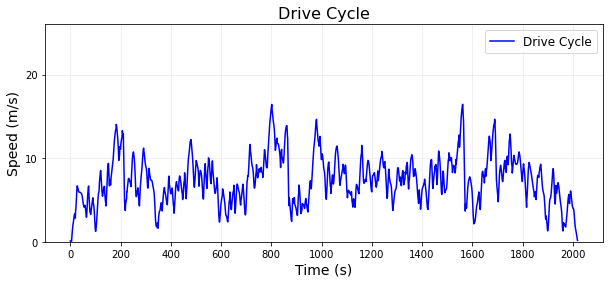

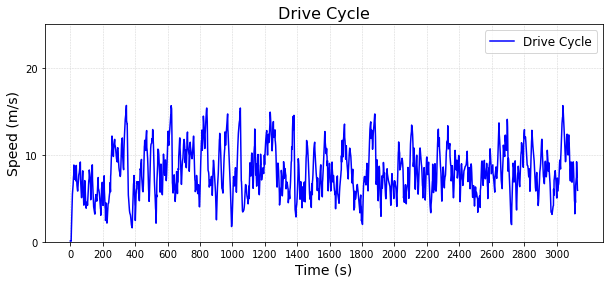

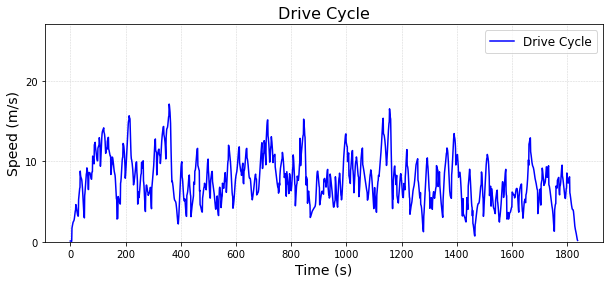

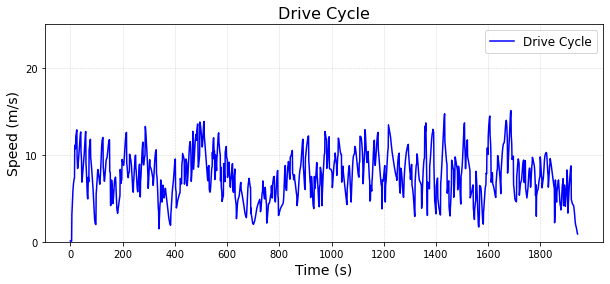

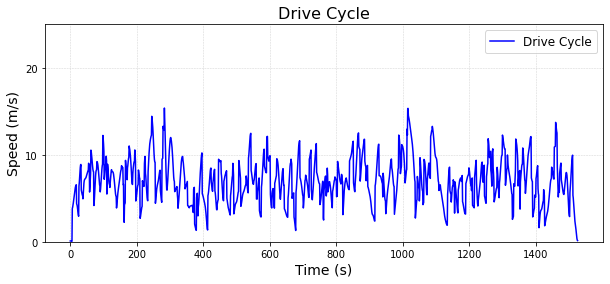

...

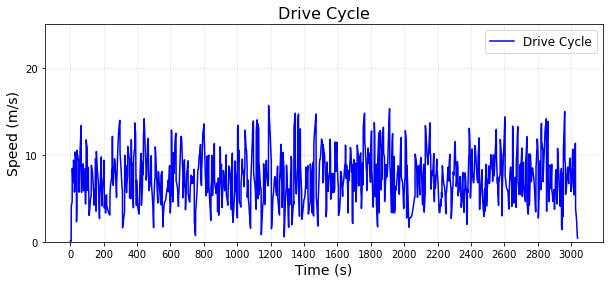

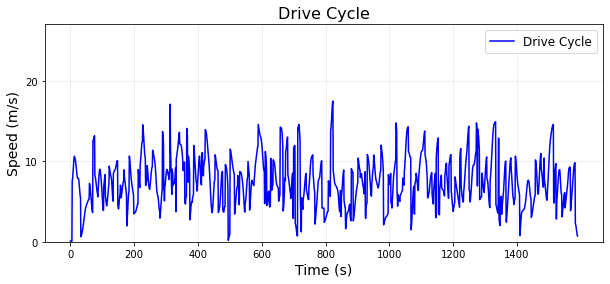

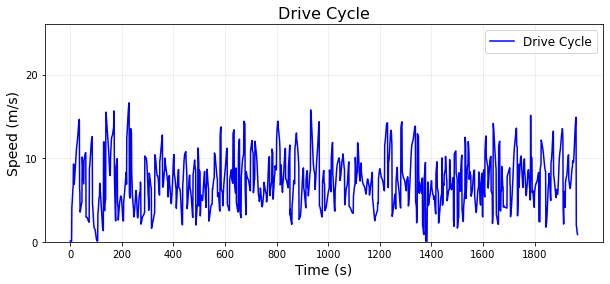

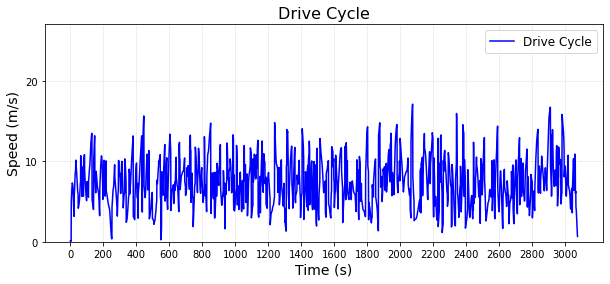

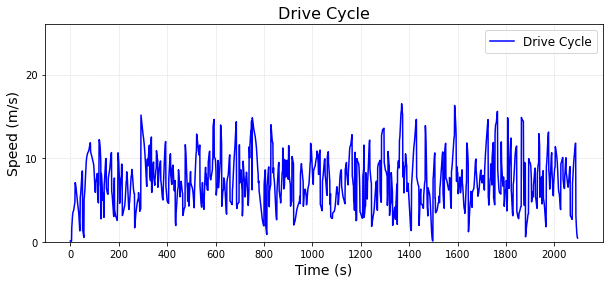

In [38]:
candidateDriveCycles = []
elevationDriveCycles = []
modeDriveCycles = []
check = [0.05, 0.08, 0.1]
for x in check :
    for i in range(100):
        try :
            x , y, z = driveCycle(i)
            candidateDriveCycles.append(x)
            elevationDriveCycles.append(y)
            modeDriveCycles.append(z)
        except :
            pass

### 9. Selecting the best drivecycle out of all generated one 

In [39]:
def testing(observed_data,candidate_cycle,mode_cycle) : 

    value_counts_dc = Counter(mode_cycle)

    for s in value_counts_dc:
            value_counts_dc[s] = value_counts_dc[s]/len(mode_cycle)
            
            
    od_list = observed_data["mode"].tolist()
    value_counts_od = Counter(od_list)

    for s in value_counts_od:
            value_counts_od[s] = value_counts_od[s]/len(od_list)
    
    add = 0
    
    for s in value_counts_od:
        
        add+=abs(value_counts_od[s]-value_counts_dc[s])
    
    
    # Define the speed and acceleration resolutions
    speed_resolution = 1  # mph
    acceleration_resolution = 1  # mph/s

    # Compute the fraction of time spent at each speed-acceleration pair in the candidate cycle
    counts_candidate = np.zeros((121, 121))
    for i in range(len(candidate_cycle) - 1):
        a = ((candidate_cycle[i+1] - candidate_cycle[i]) / acceleration_resolution)
        v = candidate_cycle[i+1] / speed_resolution
        counts_candidate[int(a), int(v)] += 1
    fractions_candidate = counts_candidate / len(candidate_cycle)
    # print(fractions_candidate)
    # Compute the fraction of time spent at each speed-acceleration pair in the observed data
    counts_observed = np.zeros((121, 121))
    for i in range(len(observed_data) - 1):
        a = df_all['acceleration'][i] / acceleration_resolution
        v = observed_data['Filtered_speed'][i+1] / speed_resolution
        counts_observed[int(a), int(v)] += 1
    fractions_observed = counts_observed / len(observed_data)
    # print(fractions_observed)
    # Compute the SAFDdiff
    SAFDdiff = np.sum(np.abs(fractions_candidate - fractions_observed))
    final = add + SAFDdiff
    print("final: ",final)
    return SAFDdiff, add




In [40]:
SAFDiff_val = []
mode_diff_val = []
comb = []
for i in range(len(candidateDriveCycles)) : 
    out = testing(df_all,candidateDriveCycles[i],modeDriveCycles[i])
    SAFDiff_val.append(out[0])
    mode_diff_val.append(out[1])
    comb.append(out[0]+out[1])


final:  0.2500161983347339
final:  0.28471714701463713
final:  0.2030802881107982
final:  0.30581558446490187
final:  0.3531614743763604
final:  0.2644654820647453
final:  0.31373381900092623
final:  0.2890119912199142
final:  0.2524227029955276
final:  0.2715869339957771
final:  0.28373273392453613
final:  0.2702885175326658
final:  0.2917107550075872
final:  0.2804132107837279
final:  0.300622741550386
final:  0.29064816731889825
final:  0.27519902027544324
final:  0.36695641793979655
final:  0.3289969471249315
final:  0.3844355042174047
final:  0.2818461593400955
final:  0.2756069908441923
final:  0.28854951850624494
final:  0.26751357858629465
final:  0.3225733197624086
final:  0.3264695581061216
final:  0.2943660408557383
final:  0.2696336346279627
final:  0.3105313776087798
final:  0.2600896804627542
final:  0.38430260143007666
final:  0.31383618616145587
final:  0.2867451995345184
final:  0.32348372174494183
final:  0.24674204482833634
final:  0.23704334736032368
final:  0.31074

7.549717116412521 7.248876445086706 7.536832018038325 7.634173014145804
3.0170480470348 2.8774669615465593 3.114467295799928 2.969744742787351


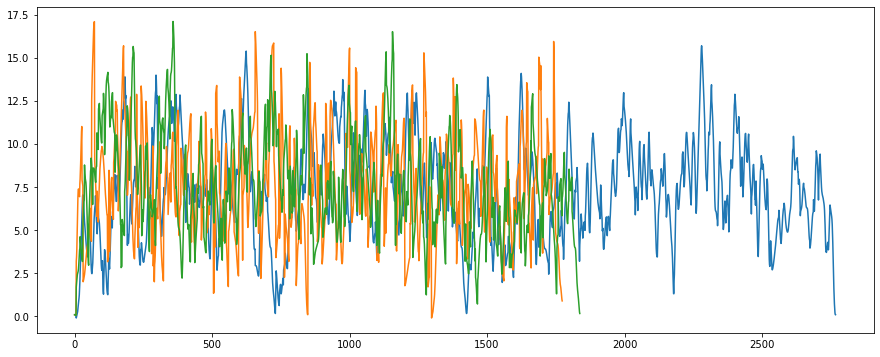

In [41]:
SAFDiff_cycle = candidateDriveCycles[SAFDiff_val.index(min(SAFDiff_val))]
mode_diff_cycle = candidateDriveCycles[mode_diff_val.index(min(mode_diff_val))]
comb_cycle = candidateDriveCycles[comb.index(min(comb))]
comb_angle = elevationDriveCycles[comb.index(min(comb))]
# Mean of the driveCycles  
mean_observed_data = df_all['Filtered_speed'].mean()
mean_SADiff = sum(SAFDiff_cycle) / len(SAFDiff_cycle)
mean_mode_diff = sum(mode_diff_cycle) / len(mode_diff_cycle)
mean_comb = sum(comb_cycle) / len(comb_cycle)
print(mean_observed_data,mean_SADiff,mean_mode_diff,mean_comb)
# calculate the standard deviation
std_dev_observed_data = df_all['Filtered_speed'].std()
std_dev_SADiff = math.sqrt(sum([(x - mean_SADiff)**2 for x in SAFDiff_cycle]) / len(SAFDiff_cycle))
std_dev_mode_diff = math.sqrt(sum([(x - mean_mode_diff)**2 for x in mode_diff_cycle]) / len(mode_diff_cycle))
std_dev_comb = math.sqrt(sum([(x - mean_comb)**2 for x in comb_cycle]) / len(comb_cycle))
print(std_dev_observed_data,std_dev_SADiff,std_dev_mode_diff,std_dev_comb)

plt.figure(figsize = (15,6))
plt.plot(SAFDiff_cycle)
plt.plot(mode_diff_cycle)
plt.plot(comb_cycle)
plt.show()

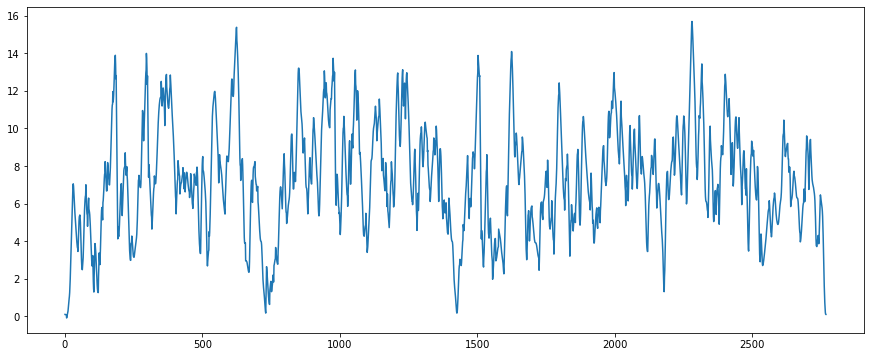

In [42]:
plt.figure(figsize = (15,6))
plt.plot(SAFDiff_cycle)

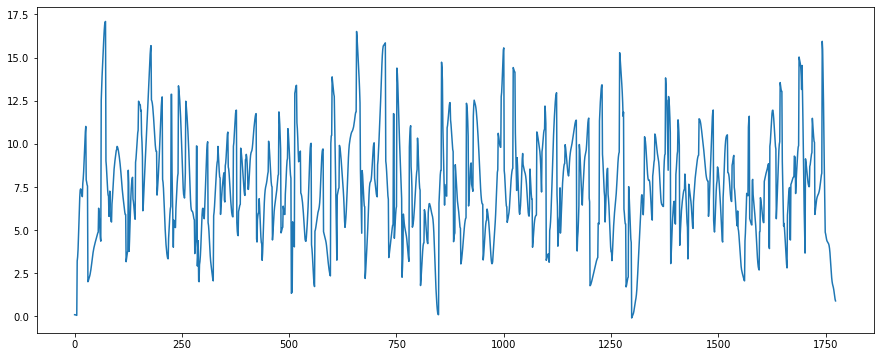

In [43]:
plt.figure(figsize = (15,6))
plt.plot(mode_diff_cycle)

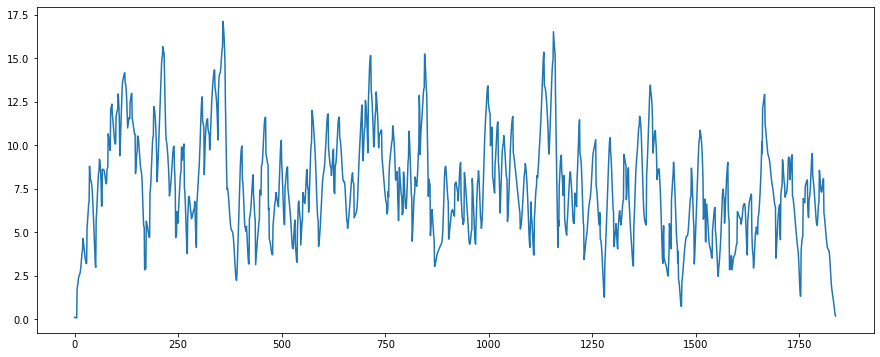

In [44]:
plt.figure(figsize = (15,6))
plt.plot(comb_cycle)

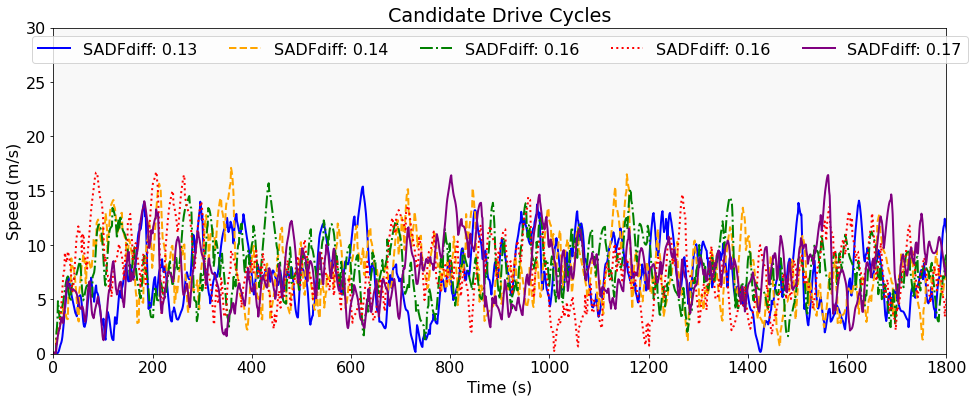

In [45]:

def min_n_values_with_index(lst, n):
    # Sort the list and get the indices of the sorted list
    sorted_indices = sorted(range(len(lst)), key=lambda k: lst[k])
    # Return the first n indices and their corresponding values
    return [(sorted_indices[i], lst[sorted_indices[i]]) for i in range(n)]

x = min_n_values_with_index(SAFDiff_val,5)
plt.figure(figsize=(16, 6))


# Set the font size of the axis labels and title
plt.rcParams.update({'font.size': 16})

# Set the colors and styles of the plot lines
colors = ['blue', 'orange', 'green', 'red', 'purple']
styles = ['-', '--', '-.', ':', '-']
for i, idx in enumerate(x):
    plt.plot(candidateDriveCycles[idx[0]], label=f"SADFdiff: {idx[1]:.2f}", color=colors[i%5], linestyle=styles[i%5], linewidth=2)

# Set the limits and ticks of the x and y axes
plt.xlim(0, 1800)
plt.xticks(range(0, 1801, 200))
plt.ylim(0, 30)
plt.yticks(range(0, 31, 5))

# Set the legend label and its position
plt.legend(ncol=5, loc='upper center')

# Set the background color of the plot
plt.gca().set_facecolor('#F8F8F8')

# Set the title and labels of the x and y axes
plt.title('Candidate Drive Cycles')
plt.xlabel('Time (s)')
plt.ylabel('Speed (m/s)')

# Save the plot as a PNG image
plt.savefig('candidate_drive_cycles.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()



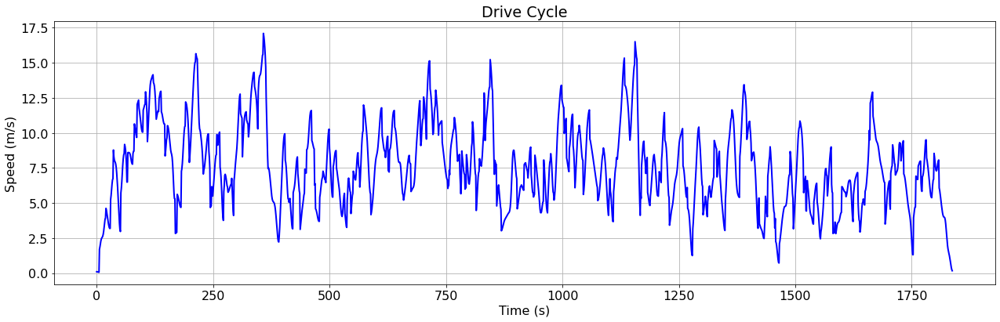

In [46]:
plt.figure(figsize=(18, 6))
# Increase the font size of the axis labels and title
plt.rcParams.update({'font.size': 16})

# Set the color of the plot line and increase its thickness
plt.plot(comb_cycle, color='blue', linewidth=2)

# Add a grid to the plot
plt.grid()

# Set the legend label and its position

plt.title('Drive Cycle')
plt.xlabel('Time (s)')
plt.ylabel('Speed (m/s)')

# Adjust the spacing of the subplots
plt.tight_layout()


# Show the plot
plt.show()


# DriveCycle Analysis

In [57]:
df = pd.DataFrame({'Speed [km/h]': comb_cycle, 'angle': comb_angle})

# convert the 'Speed [km/h]' column to km/s
df['Speed [km/h]'] = df['Speed [km/h]']*18/5

# add a column with time values
df['Time [s]'] = pd.Series(range(len(comb_cycle)))

print(df)

      Speed [km/h]     angle  Time [s]
0            0.360  0.000000         0
1            0.360  0.000000         1
2            0.324  0.000000         2
3            0.288  0.000000         3
4            0.252  0.000000         4
...            ...       ...       ...
1833         2.988 -4.999438      1833
1834         2.160  0.000000      1834
1835         1.440  0.000000      1835
1836         0.900  0.000000      1836
1837         0.612  0.000000      1837

[1838 rows x 3 columns]


### 1. Function that wil canculate ForceData required for the starting page 

In [58]:

def dataForce(mass,rho,Cd,Af,g,alpha,r,df):
    df['speed'] = df['Speed [km/h]']*(5/18)
    df['distance'] = (df['speed'] * df['Time [s]'].diff()).cumsum().fillna(0)
    df['Acceleration'] = df['speed'].diff() / df['Time [s]'].diff()
    df['positiveAcceleration'] = df['Acceleration'].where(df['Acceleration'] >= 0, 0)

    # Force due to acceleration 
    df['Force_Acceleration'] = mass*df['positiveAcceleration']

    # Force due to drag 
    df['Force_Drag'] = 0.5*rho*Af*Cd*(df['speed']**2)

    # Force due to friction 
    # Since friction cofficient itself is speed dependent so first we have to calculate the friction cofficient 
    df['Friction_Cofficient'] = np.where(df['Speed [km/h]'] <= 0, 0, 0.01*(1+df['Speed [km/h]']/160))
    df['Force_Rolling_Resistance'] = df['Friction_Cofficient']*mass*g*np.cos(np.radians(df['angle']))

    # Force due to its own weight travelling on a gradient 
    df['Force_Weight'] = mass*np.sin(np.radians(df['angle']))

    # Total Force at all the instant points

    # Doubt for calculating the all forces We should only consider5 the forces where the acceleration is positive
    # As the vehicle is in braking mode when the acceleration is negative and battery is not providing any energy
    # Total Force at all the instant points

    df['Force_Total'] = df['Force_Weight'] + df['Force_Rolling_Resistance'] + df['Force_Drag'] + df['Force_Acceleration']

    # Force vise power analysdf_force_analysis
    df['Power_Drag'] = df['Force_Drag']*df['speed']
    df['Power_Rolling_Resistance'] = df['Force_Rolling_Resistance']*df['speed']
    df['Power_Drag'] = df['Force_Drag']*df['speed']
    df['Power_Acceleration'] = df['Force_Acceleration']*df['speed']
    df['Power_Total'] = df['Force_Total']*df['speed']


    df['omega'] = df['speed']/r
    df['omega_rpm'] = df['omega']*(60/(2*np.pi))
    df['Torque_Wheel'] = df['Force_Total']*r

    df['Power_Wheels'] = df['Torque_Wheel']*df['omega']
    return df 


### 2. Now the series required for the MotorParameters will be calculated here 

In [59]:
def DataMotor(Motor_max_to_base_speed_ratio,Motor_overload_factor_power,Motor_overload_factor_for_torque,gear_ratio,gear_efficiency,df):
    # Speed and the Torque on the motor side 
    df['Motor_Torque'] = np.where(df['Torque_Wheel'] >= 0, 
                                        df['Torque_Wheel']/(gear_ratio*gear_efficiency), 
                                        0)
    df['Motor_Speed'] = (df['omega']*gear_ratio) 
    df['Motor_Speed_rpm'] = (df['omega_rpm']*gear_ratio) 

    # Get the maximum value of Motor_Speed
    max_speed_Rpm = df['Motor_Speed_rpm'].max()
    # Get the number of values in the Motor_Speed column
    num_values = df.shape[0]
    # Generate a new series with the same number of values as the Motor_Speed column
    plottingSpeedRpm = np.linspace(0, max_speed_Rpm, num_values)
    # Add the new series to the df_motor dataframe
    df['plotting_Speed_Rpm'] = plottingSpeedRpm

    # Get the maximum value of Motor_Speed
    max_speed = df['Motor_Speed'].max()
    # Get the number of values in the Motor_Speed column
    num_values = df.shape[0]
    # Generate a new series with the same number of values as the Motor_Speed column
    plottingSpeed = np.linspace(0, max_speed, num_values)
    # Add the new series to the df_motor dataframe
    df['plotting_Speed'] = plottingSpeed

    # Maximum Torque and speed at maximum torque 
    max_index = df['Motor_Torque'].idxmax()
    speed_at_peak_torque = df.loc[max_index, 'Motor_Speed_rpm']
    max_torque = df.loc[max_index, 'Motor_Torque']

    # Finding the motor output power
    df['power_motor_output'] = df['Motor_Torque']*df['Motor_Speed']

    # Formulas For the further analysis 
    base_speed_for_motor = max_speed/Motor_max_to_base_speed_ratio # Base Speed of the motor in radian per second 
    rated_torque_for_motor = max_torque/Motor_overload_factor_for_torque # Max Torque in Nm 
    rated_power_of_motor = rated_torque_for_motor*base_speed_for_motor/(1000) # Rated Power of in KW 
    peak_power_of_motor = rated_power_of_motor*Motor_overload_factor_power # Peak Power of the motor in KW 

    # For plotiing motor Rated Torque-Speed Chracterstics 
    df['plotting_rated_motor_torque'] = np.where(df['plotting_Speed'] <= base_speed_for_motor, 
                                           rated_torque_for_motor, 
                                           rated_power_of_motor*1000/df['plotting_Speed'])

    # For plotiing motor Peak Torque-Speed Chracterstics 
    df['plotting_peak_motor_torque'] = np.where(df['plotting_Speed'] <= base_speed_for_motor, 
                                           max_torque, 
                                           peak_power_of_motor*1000/df['plotting_Speed'])
    return df 

### 3. Motor Parameters are calculated from the dataFrame Here

In [60]:
def motorParameters(df):
    motorpara = {}
    max_speed = df['Motor_Speed'].max()
    motorpara['max_speed'] = max_speed

    # Maximum Torque and speed at maximum torque 
    max_index = df['Motor_Torque'].idxmax()
    speed_at_peak_torque = df.loc[max_index, 'Motor_Speed_rpm']
    motorpara['speed_at_peak_torque'] = speed_at_peak_torque
    max_torque = df.loc[max_index, 'Motor_Torque']

    # Formulas For the further analysis 
    base_speed_for_motor = max_speed/Motor_max_to_base_speed_ratio # Base Speed of the motor in radian per second 
    rated_torque_for_motor = max_torque/Motor_overload_factor_for_torque # Max Torque in Nm 
    rated_power_of_motor = rated_torque_for_motor*base_speed_for_motor/(1000) # Rated Power of in KW 
    peak_power_of_motor = rated_power_of_motor*Motor_overload_factor_power # Peak Power of the motor in KW 
    
    # Motor parameters after the calculations   
    motorpara['max_torque'] = max_torque
    motorpara['Motor_overload_factor_for_torque'] = Motor_overload_factor_for_torque
    motorpara['rated_torque_for_motor'] = rated_torque_for_motor
    motorpara['base_speed_for_motor'] = base_speed_for_motor
    motorpara['Motor_max_to_base_speed_ratio'] = Motor_max_to_base_speed_ratio
    motorpara['rated_power_of_motor'] = rated_power_of_motor
    motorpara['peak_power_of_motor'] = peak_power_of_motor
    
    
    return motorpara

### 4. Funtion that will calculate the Cyclic Motor efficieny of the motor

In [61]:
def efficiencyMap():
  return  np.array([
    [0, 0, 0, 0, 0, 0, 0, 0, 0,0],
    [0, 11.6659, 11.6659, 11.6659, 13.7542, 15.8425, 13.7542, 13.7542, 11.6659, 7.4891],
    [0, 61.7851, 70.1393, 76.4042, 80.5809, 80.5809, 80.5809, 80.5809, 80.5809, 78.4926],
    [0, 72.2276, 76.4042, 82.6692, 86.8459, 86.8459, 88.9342, 88.9342, 86.8459, 86.8459],
    [0, 70.1392, 78.4926, 84.7576, 88.9342, 88.9342, 88.9342, 88.9342, 88.9342, 88.9342],
    [0, 68.0506, 76.4042, 84.7576, 86.8459, 88.9342, 88.9342, 88.9342, 88.9342, 88.9342],
    [0, 65.9621, 74.3159, 82.6692, 86.8459, 88.9342, 88.9342, 88.9342, 88.9342, 86.8459],
    [0, 59.6968, 72.2276, 80.5809, 84.7576, 86.8459, 88.9342, 88.9342, 86.8459, 86.8459]
  ])

def cyclicMotorEfficiency(df):
    maximum_speed_rpm = df['Motor_Speed_rpm'].max() 
    max_torque = df['Motor_Torque'].max()

    # Define the range of values for speed and torque
    speed = np.linspace(0,maximum_speed_rpm, num=10) # This will reshape the motor speed in rpm [0,maximum_Motor_speed_in_Rpm]
    torque = np.linspace(-10, max_torque, num=8) # This will reshape the motor torque in [-10,max_torque]
    
    Z = efficiencyMap()
    
    f = interpolate.interp2d(speed, torque, Z , kind='linear')
    
    eff = []
    for i in range(len(df['Motor_Speed_rpm'])):
        x = f(df['Motor_Speed_rpm'][i], df['Motor_Torque'][i])
        if x[0] >=10 : 
            eff.append(x[0])
        else : 
            eff.append(0.1)
    
    # Create a new Pandas Series object from the eff list
    efficiency = pd.Series(eff, name='efficiency')



    # Add the efficiency column to the df_motor DataFrame
    df = pd.concat([df, efficiency], axis=1)

    
    return df

### 5. Sereis reqired for the calculation of Battery Parameters are added here in DataFrame 

In [62]:
def batteryParametersData(df):
    cyclicMotorEfficiency = df['efficiency'].mean()
    Cyclic_inverter_efficiency = 1
    
    df['power_inverter_output'] = df['power_motor_output']*100/df['efficiency']
    df['power_battery_output'] = df['power_inverter_output']/Cyclic_inverter_efficiency
    df['Energy_battery_output'] = df['power_battery_output']*1/3600
    
    return df 

### 6. Now this funtion will calculate all the Battery Parameters

In [63]:
def batteryParameters(df, range_we_wanted, optimal_c_rate, specific_energy_battery, battery_voltage, battery_utilization):
    batteryPara = {}
    
    batteryPara['Total_energy_consumed_in_drive_cycle'] = df['Energy_battery_output'].sum()/1000 #Kwhr/km
    
    Total_distance_of_drive_cycle = df['distance'].iloc[-1]/1000
    
    batteryPara['Milage'] = batteryPara['Total_energy_consumed_in_drive_cycle']/Total_distance_of_drive_cycle
    batteryPara['battery_size'] = range_we_wanted*  batteryPara['Milage'] # kWhr 
    batteryPara['optimal_battery_power'] = batteryPara['battery_size']*optimal_c_rate
    batteryPara['weight_of_the_battery'] = batteryPara['optimal_battery_power']*1000/specific_energy_battery
    batteryPara['battery_Ah'] =  batteryPara['battery_size']*1000/battery_voltage
    batteryPara['usable_Ah'] = batteryPara['battery_Ah']*battery_utilization
    
    return batteryPara

In [64]:
mass = 260
rho = 1.22   ## Density of Air
Cd = 0.78   ## Aerodynamic Drag
Af = 0.68   ## frontal area of the vehical
g = 9.81  # graviatational coefficient
alpha=0   # Road Angle
r = 0.18  # radius of wheel in meters

df = dataForce(mass,rho,Cd,Af,g,alpha,r,df)

Motor_overload_factor_power = 1.8
Motor_overload_factor_for_torque = 1.8
Motor_max_to_base_speed_ratio = 1.75

gear_ratio_fixed = 4.5
gear_efficiency = 0.96

df = DataMotor(Motor_max_to_base_speed_ratio,Motor_overload_factor_power,Motor_overload_factor_for_torque,gear_ratio_fixed,gear_efficiency,df)
motorpara = motorParameters(df)

In [65]:
motorpara

{'max_speed': 427.50000000000006,
 'speed_at_peak_torque': 1986.2536897868542,
 'max_torque': 35.29988704199831,
 'Motor_overload_factor_for_torque': 1.8,
 'rated_torque_for_motor': 19.611048356665727,
 'base_speed_for_motor': 244.2857142857143,
 'Motor_max_to_base_speed_ratio': 1.75,
 'rated_power_of_motor': 4.790698955699771,
 'peak_power_of_motor': 8.623258120259587}

In [66]:
df = cyclicMotorEfficiency(df)
df = batteryParametersData(df)

In [72]:
batteryParameters(df, 100, 1, 200, 72, 0.8)

{'Total_energy_consumed_in_drive_cycle': 0.629072132745272,
 'Milage': 0.04483281790379457,
 'battery_size': 4.483281790379457,
 'optimal_battery_power': 4.483281790379457,
 'weight_of_the_battery': 22.41640895189728,
 'battery_Ah': 62.26780264415912,
 'usable_Ah': 49.814242115327296}